<a href="https://colab.research.google.com/github/fernandaaraujo1/ENG1111/blob/main/ProjetoFinal.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
# importando as bibliotecas
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from google.colab import drive
import tensorflow as tf
from tensorflow import keras



# Importando a biblioteca para carregar arquivos do drive
from google.colab import drive

# Importando bibliotecas referentes as redes neurais
from keras.preprocessing.image import ImageDataGenerator
from keras_preprocessing.image import load_img
from keras.utils import to_categorical,img_to_array, load_img
from keras.models import Sequential
from keras.layers import Conv2D, MaxPooling2D, Dropout, Flatten, Dense, Activation, BatchNormalization
from keras.callbacks import EarlyStopping, ReduceLROnPlateau

# Importando outras bibliotecas uteis
from sklearn.model_selection import train_test_split
import os
import random

#importando bibliotecas de métricas
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report
import cv2
from tqdm import tqdm





import PIL

In [ ]:
# Montando Google Drive
drive.mount('/content/drive')

DATADIR = "/content/drive/MyDrive/basededados/"

CATEGORIES = ["smile_", "non_smile"]



Mounted at /content/drive


/content/drive/MyDrive/basededados/smile_


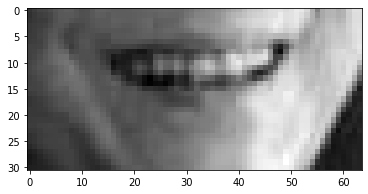

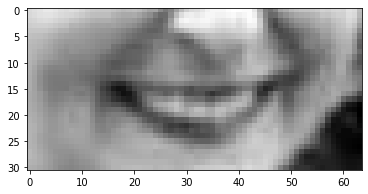

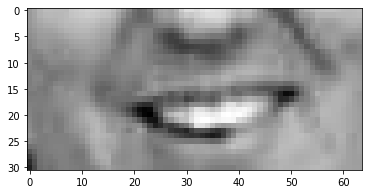

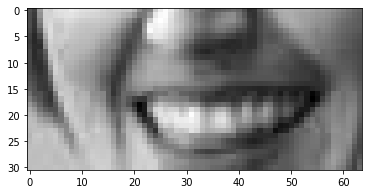

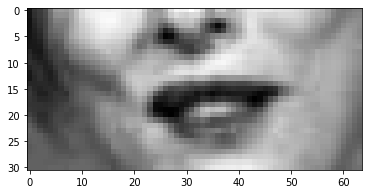

...

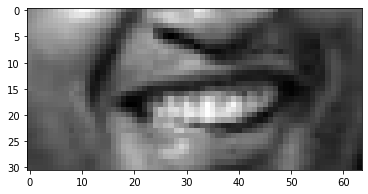

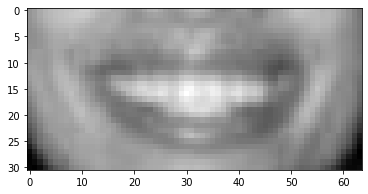

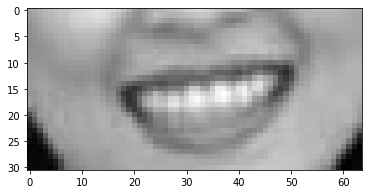

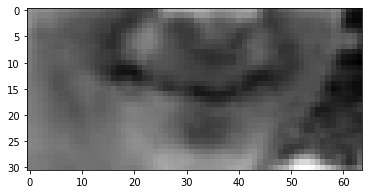

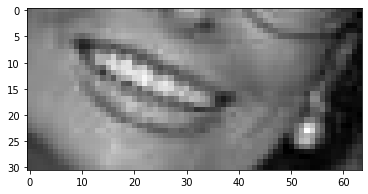

/content/drive/MyDrive/basededados/non_smile


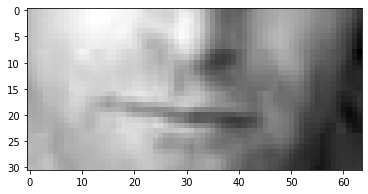

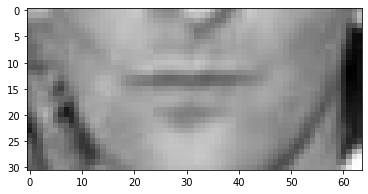

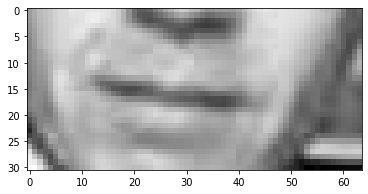

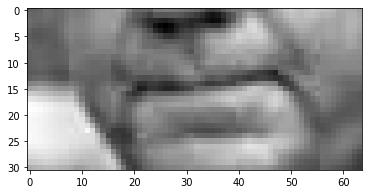

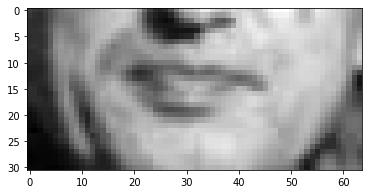

...

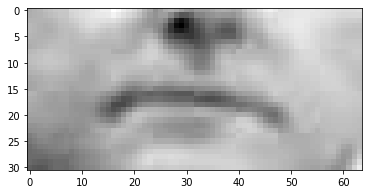

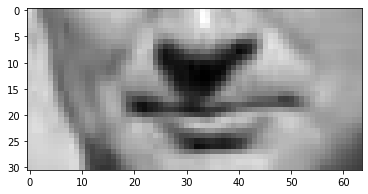

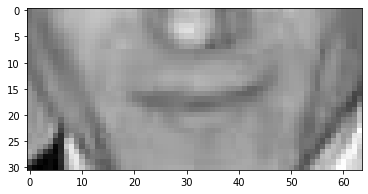

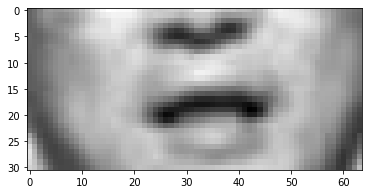

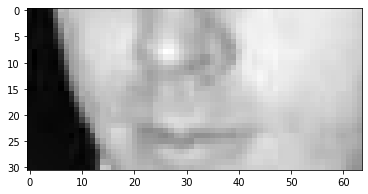

[array([[ 64,  72,  79, ..., 203, 218, 218],
       [ 62,  69,  74, ..., 201, 215, 216],
       [ 64,  68,  71, ..., 202, 215, 216],
       ...,
       [ 39,  44,  52, ...,  44,  52,  49],
       [ 41,  45,  50, ...,  43,  51,  49],
       [ 46,  47,  49, ...,  43,  50,  49]], dtype=uint8), 1]


In [ ]:
#Tornando a base de dados legível para o código
training_data=[]
for category in CATEGORIES:  
    path = os.path.join(DATADIR,category)  # create path to smile or non_smile
    print (path)
    for img in os.listdir(path):  
        img_array = cv2.imread(os.path.join(path,img) ,cv2.IMREAD_GRAYSCALE)  
        new_array=img_array[32:63]
        plt.imshow(new_array, cmap='gray')
        plt.show() 
        if category== "smile_":
          training_data.append([new_array,1])
        else:
          training_data.append([new_array,0])
print(training_data[0])

In [ ]:
#Verificando o tamanho das matrizes
print(new_array.shape)


(31, 64)


In [ ]:
import random

random.shuffle(training_data)

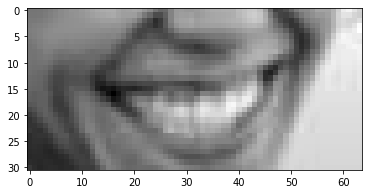

sorrindo!ˆ


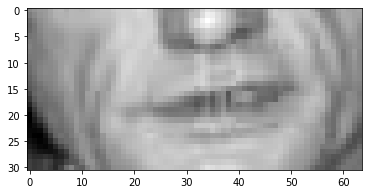

não sorrindo!ˆ


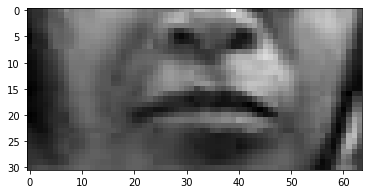

não sorrindo!ˆ


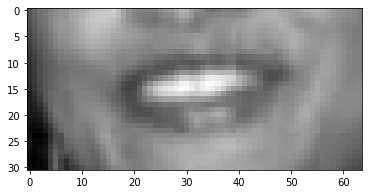

sorrindo!ˆ


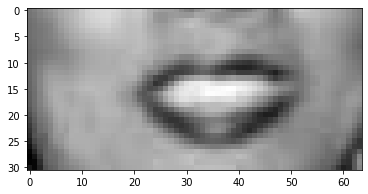

sorrindo!ˆ


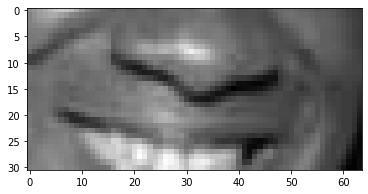

sorrindo!ˆ


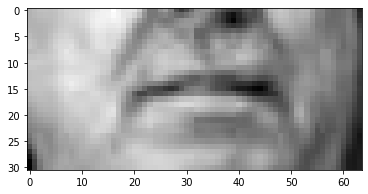

não sorrindo!ˆ


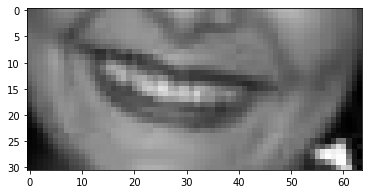

sorrindo!ˆ


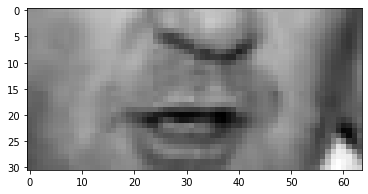

não sorrindo!ˆ


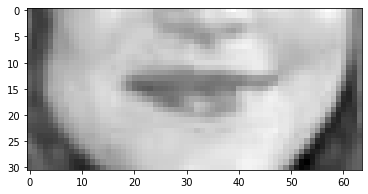

não sorrindo!ˆ


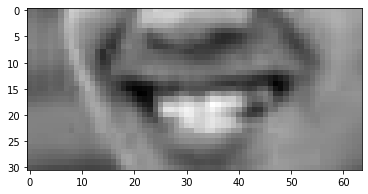

sorrindo!ˆ


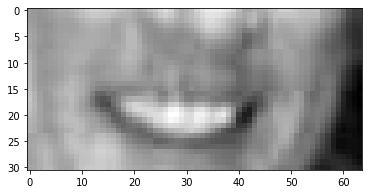

sorrindo!ˆ


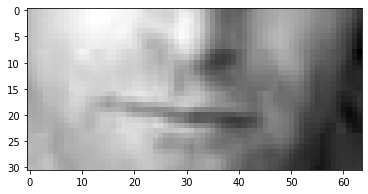

não sorrindo!ˆ


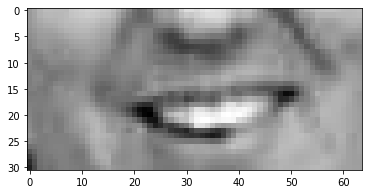

sorrindo!ˆ


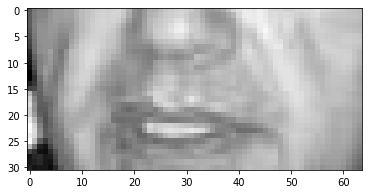

não sorrindo!ˆ


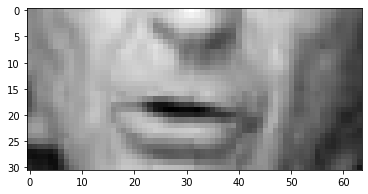

não sorrindo!ˆ


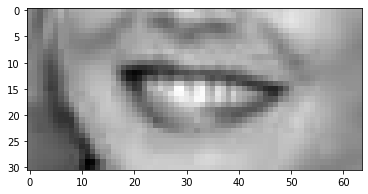

sorrindo!ˆ


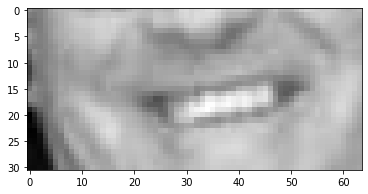

sorrindo!ˆ


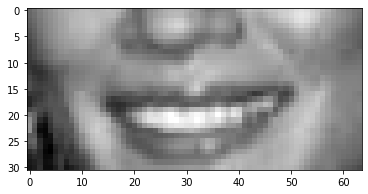

sorrindo!ˆ


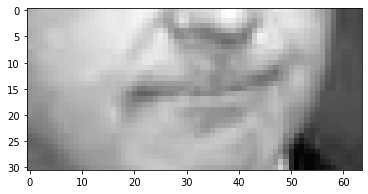

não sorrindo!ˆ


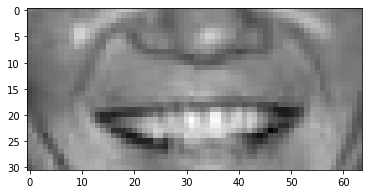

sorrindo!ˆ


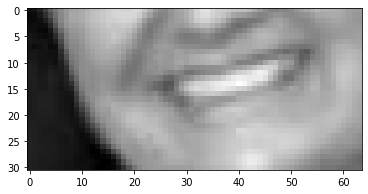

sorrindo!ˆ


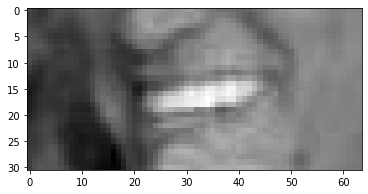

sorrindo!ˆ


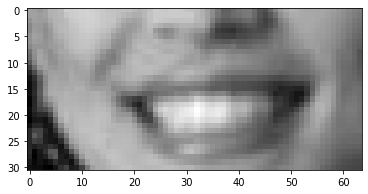

sorrindo!ˆ


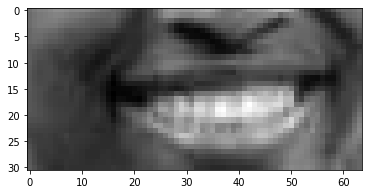

sorrindo!ˆ


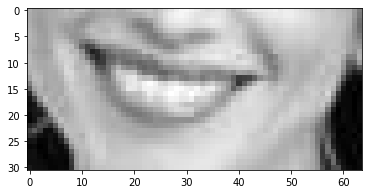

sorrindo!ˆ


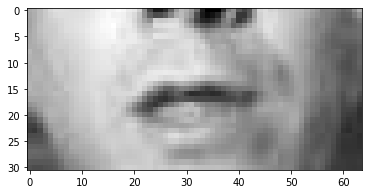

não sorrindo!ˆ


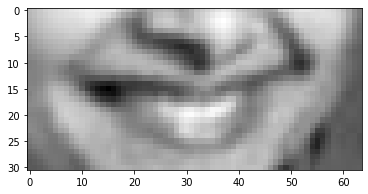

sorrindo!ˆ


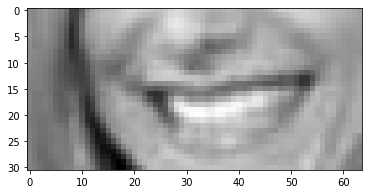

sorrindo!ˆ


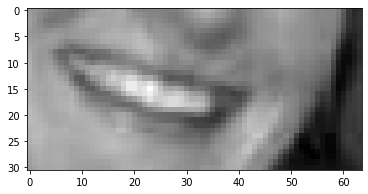

sorrindo!ˆ


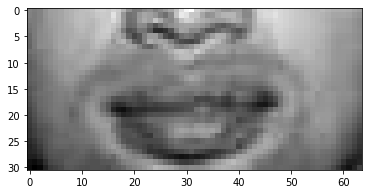

não sorrindo!ˆ


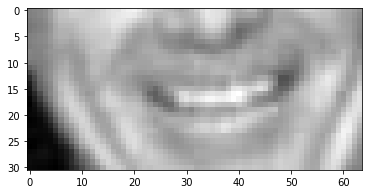

sorrindo!ˆ


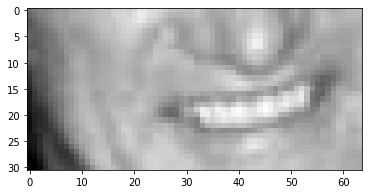

sorrindo!ˆ


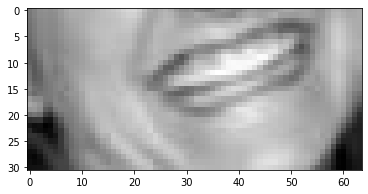

sorrindo!ˆ


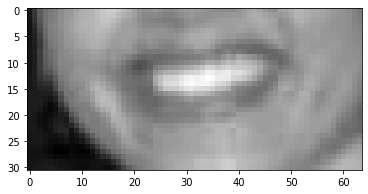

sorrindo!ˆ


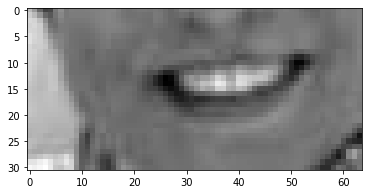

sorrindo!ˆ


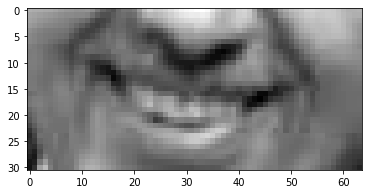

sorrindo!ˆ


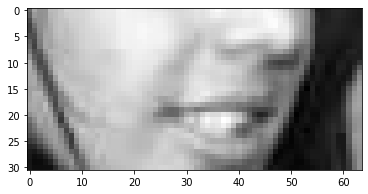

sorrindo!ˆ


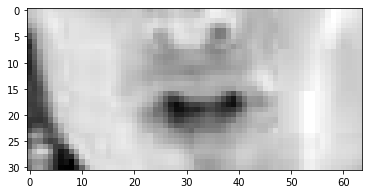

não sorrindo!ˆ


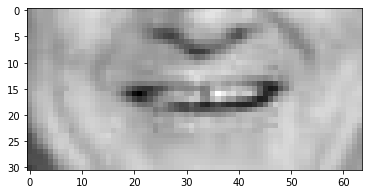

sorrindo!ˆ


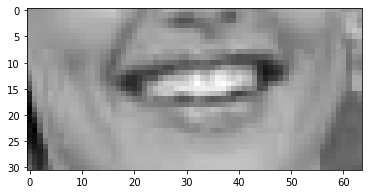

sorrindo!ˆ


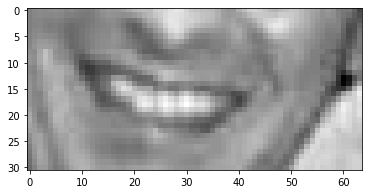

sorrindo!ˆ


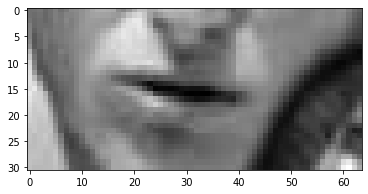

não sorrindo!ˆ


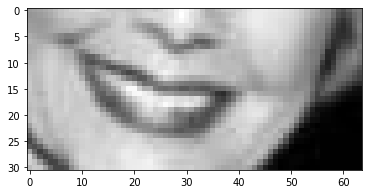

sorrindo!ˆ


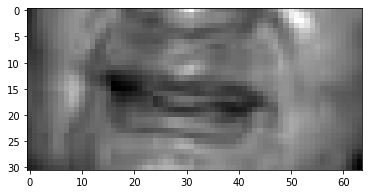

não sorrindo!ˆ


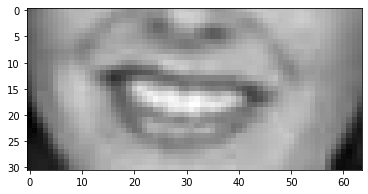

sorrindo!ˆ


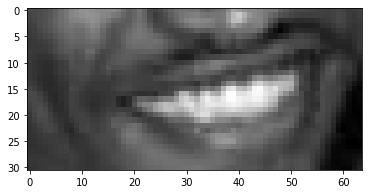

sorrindo!ˆ


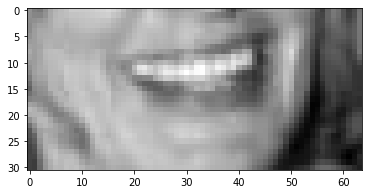

sorrindo!ˆ


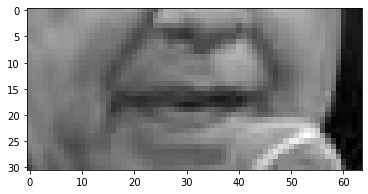

não sorrindo!ˆ


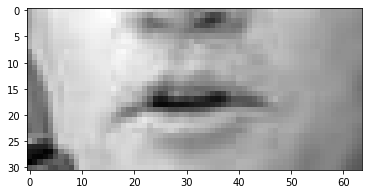

não sorrindo!ˆ


In [ ]:
#Verificando a lista 
for sample in training_data[:50]:
    plt.imshow(sample[0],cmap='gray') 
    plt.show()
    if sample[1]==0:
      print("não sorrindo!ˆ")
    else:
      print("sorrindo!ˆ")

In [ ]:
#Embaralhando a lista e dividindo entre duas listas: uma para as matrizes e um para a classificação
import random

random.shuffle(training_data)

X = []
y = []

for features,label in training_data:
    X.append(features)
    y.append(label)

print(X[0].reshape(-1, 31, 64, 1))

X = np.array(X).reshape(-1, 31, 64, 1)
print(X)
print(y)



[[[[144]
   [147]
   [150]
   ...
   [145]
   [138]
   [134]]

  [[140]
   [144]
   [148]
   ...
   [141]
   [135]
   [131]]

  [[135]
   [140]
   [146]
   ...
   [136]
   [130]
   [126]]

  ...

  [[117]
   [116]
   [119]
   ...
   [ 47]
   [ 48]
   [ 52]]

  [[120]
   [118]
   [118]
   ...
   [ 41]
   [ 43]
   [ 44]]

  [[121]
   [120]
   [117]
   ...
   [ 41]
   [ 40]
   [ 37]]]]
[[[[144]
   [147]
   [150]
   ...
   [145]
   [138]
   [134]]

  [[140]
   [144]
   [148]
   ...
   [141]
   [135]
   [131]]

  [[135]
   [140]
   [146]
   ...
   [136]
   [130]
   [126]]

  ...

  [[117]
   [116]
   [119]
   ...
   [ 47]
   [ 48]
   [ 52]]

  [[120]
   [118]
   [118]
   ...
   [ 41]
   [ 43]
   [ 44]]

  [[121]
   [120]
   [117]
   ...
   [ 41]
   [ 40]
   [ 37]]]


 [[[111]
   [ 95]
   [ 92]
   ...
   [ 84]
   [ 78]
   [ 74]]

  [[111]
   [ 93]
   [ 89]
   ...
   [ 81]
   [ 76]
   [ 72]]

  [[111]
   [ 90]
   [ 84]
   ...
   [ 76]
   [ 73]
   [ 71]]

  ...

  [[108]
   [104]
   [107]
   .

In [ ]:
#Salvando
import pickle

pickle_out = open("X.pickle","wb")
pickle.dump(X, pickle_out)
pickle_out.close()

pickle_out = open("y.pickle","wb")
pickle.dump(y, pickle_out)
pickle_out.close()

In [ ]:
#Treino da rede neural
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, Activation, Flatten, Conv2D, MaxPooling2D
from tensorflow.keras.datasets import cifar10
import pickle
import numpy

X=pickle.load(open("X.pickle","rb"))
y=pickle.load(open("y.pickle","rb"))
X = X/255.0

model = Sequential()

model.add(Conv2D(64, (3,3), input_shape=X.shape[1:]))
model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))

model.add(Conv2D(64, (3,3)))
model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))

model.add(Flatten())  

model.add(Dense(64))

model.add(Dense(1))
model.add(Activation('sigmoid'))

model.compile(loss="binary_crossentropy",
              optimizer="adam",
              metrics=['accuracy'])

y=numpy.array(y)
model.fit(X, y, batch_size=32, epochs=50,validation_split=0.3);

Epoch 1/50
27/27 [==============================] - 5s 148ms/step - loss: 0.6665 - accuracy: 0.6527 - val_loss: 0.6050 - val_accuracy: 0.5223
Epoch 2/50
27/27 [==============================] - 4s 144ms/step - loss: 0.4913 - accuracy: 0.7868 - val_loss: 0.5443 - val_accuracy: 0.6899
Epoch 3/50
27/27 [==============================] - 4s 144ms/step - loss: 0.3665 - accuracy: 0.8383 - val_loss: 0.3177 - val_accuracy: 0.8799
Epoch 4/50
27/27 [==============================] - 4s 142ms/step - loss: 0.2502 - accuracy: 0.8994 - val_loss: 0.3180 - val_accuracy: 0.8743
Epoch 5/50
27/27 [==============================] - 4s 141ms/step - loss: 0.2035 - accuracy: 0.9162 - val_loss: 0.2739 - val_accuracy: 0.8994
Epoch 6/50
27/27 [==============================] - 4s 145ms/step - loss: 0.1914 - accuracy: 0.9281 - val_loss: 0.2473 - val_accuracy: 0.8994
Epoch 7/50
27/27 [==============================] - 4s 144ms/step - loss: 0.1504 - accuracy: 0.9473 - val_loss: 0.2338 - val_accuracy: 0.9050
Epoch 

In [ ]:
#Salavando o modelo
model.save_weights("model.h5")



'\ndef classifica(test_img):\n    """Evaluate the model on a PIL image"""\n    test_img = test_img.resize((128,128), resample=PIL.Image.BICUBIC)\n    test_arr = img_to_array(test_img)\n    test_arr = np.expand_dims(test_arr, axis=0)\n    test_arr /= 255.0\n    \n    return float(model.predict(test_arr))\n'

In [ ]:
from pydrive.drive import GoogleDrive 
from pydrive.auth import GoogleAuth 


   
import os 
!pip install pydrive   


Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
#Importando biblioteca do anvil e função final
import anvil.media



def classifica (img):
      from os.path import abspath, dirname, join
      
      img_array = cv2.imread("teste.png",cv2.IMREAD_GRAYSCALE)  
      new_array = cv2.resize(img_array, (64,64))
      new_array=new_array[32:63]
      plt.imshow(new_array, cmap='gray')
      plt.show() 
      new_array=new_array.reshape(-1, 31, 64, 1)
      new_array=new_array/255.0
      classe = model.predict(new_array)
      if classe>0.5:
        print("Você está sorrindo!")
      else:
        print("Você não está sorrindo!")
      return classe






In [ ]:
#instalando o anvil
!pip install anvil-uplink

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 87 kB 3.6 MB/s 
     |████████████████████████████████| 51 kB 169 kB/s 
  Created wheel for ws4py: filename=ws4py-0.5.1-py3-none-any.whl size=45229 sha256=7666e58cb28034dc1f42ccbfcda61761aeb2dd1169def8349c8cbc3ba413a9ec
  Stored in directory: /root/.cache/pip/wheels/ea/f9/a1/34e2943cce3cf7daca304bfc35e91280694ced9194a487ce2f
Successfully built ws4py


In [ ]:
#Conectando ao nosso app
import anvil.server

anvil.server.connect("GB2OZJA3BHLJOMQG245COORL-TSWQDDEJHEBUBJ2Y")

Connecting to wss://anvil.works/uplink
Anvil websocket open
Connected to "Default environment" as SERVER


In [ ]:
import anvil.media
#Função do anvil
@anvil.server.callable
def classify_image(file):
    with anvil.media.TempFile(file) as f:
        img = load_img(f)
    img.save("teste.png")
        
    

    score = classifica(img)

    return score, 'smiling!'if score > 0.5 else 'not smiling!'



'\n@anvil.server.callable\ndef classify_image(file):\n    with anvil.media.TempFile(file) as f:\n        img = load_img(f,color_mode="grayscale")\n        img= img_to_array(img)\n    score = classifica(img)\n\n    return score, \'smile\' if score < 0.5 else \'non_smile\'\n    '